# Recovering Rebar Geometry from Ground-Penetrating Radar
## A Source-Profiled, Confidence-Aware Full-Waveform Inversion Pipeline

**Research Progress Report, Version 2**  
**Snapshot date:** June 1, 2026  
**Experiment scope:** numbered experiment archive through `outputs/experiments/283_*`

---

### Abstract

We present a two-dimensional computational pipeline for recovering steel rebar location, depth, and radius from ground-penetrating radar (GPR) B-scans. The framework combines a finite-difference time-domain (FDTD) electromagnetic forward solver, a full-waveform objective, an adjoint-capable inversion codebase, and a production branch built around source-profiled candidate evaluation, staged coordinate updates, and confidence-aware reporting.

The central scientific result is that rebar position is comparatively robust, while radius is sensitive to waveform details, grid rasterization, nearby bars, and acquisition geometry. Across 283 numbered experiments, we identified the source wavelet as the dominant early failure mode for radius sizing, corrected it by profiling pulse amplitude, timing, and center frequency, extended the method from one bar to multiple and differently sized bars, and added confidence labels plus ambiguity intervals so the report distinguishes what is resolved from what is merely plausible. The current frontier is acquisition-aware inversion for closely spaced variable-radius bars, where wider transmitter/receiver offset and a four-source local scan have resolved the hard close-50 mm case across three noise seeds in the latest completed aggregate.


## Executive Summary

**What we built.** We built a physics-based GPR simulation and inversion workflow that predicts radar echoes from rebar geometry and then uses those echoes to recover bar position, depth, and radius.

**Where the work began.** The initial objective was a working FDTD forward simulator, GPU acceleration, and a baseline inverse solver for synthetic rebar scenes. That foundation is complete: the forward model produces stable B-scans and wavefield animations, and the inverse framework recovers baseline geometry on clean synthetic data.

**What changed during the campaign.** The project evolved from simple recovery into a radius-identifiability study. The key question became: when does the data truly support a radius estimate, and when is the result better reported as an interval?

**Current status.** The current pipeline detects candidate bars from B-scans, assigns one seed per physical target, corrects position before estimating size, profiles the unknown source pulse, and reports confidence and ambiguity intervals. It remains a two-dimensional synthetic-data pipeline; laboratory and field data are the next validation stage.

**Most recent result.** For three differently sized bars with close 50 mm spacing, a 40 mm transmitter/receiver offset and four local source positions recovered the hard target at `(x, z, r) = (300 mm, 90 mm, 8 mm)` across seeds 13, 21, and 34, under both nominal-noise and source-mismatch cases. The aggregate reports six strong confidence rows and zero lateral ambiguity width.


## Terms Used in This Report

| Term | Meaning in this project |
|---|---|
| GPR | Ground-penetrating radar: a surface antenna transmits electromagnetic pulses and records echoes from subsurface objects. |
| B-scan | A 2-D radar image: horizontal axis is antenna position, vertical axis is travel time, and pixel intensity is echo amplitude. |
| FDTD | Finite-difference time-domain: a grid-based method for simulating electromagnetic wave propagation over time. |
| FWI | Full-waveform inversion: fitting the entire waveform, not just picked arrival times, to infer model parameters. |
| Adjoint method | An efficient gradient calculation using a forward wavefield and a backward-propagated residual wavefield. The framework includes this capability; the most robust current production branch uses staged full-waveform candidate evaluation rather than relying only on a gradient optimizer. |
| Source profiling | Fitting small nuisance parameters of the radar pulse, namely amplitude, time shift, and center-frequency scale, so pulse mismatch does not masquerade as radius error. |
| Confidence margin | The objective gap between the best candidate and the next distinct competing candidate. Larger margins mean a more decisive estimate. |
| Ambiguity interval | The range of values that the data cannot rule out under the reporting threshold. |
| Tx/Rx offset | The lateral spacing between transmitter and receiver antennas. In the latest close-spacing branch, widening this offset improved lateral separation. |


## 1. Forward Model and Baseline Inversion

FDTD simulates Maxwell's equations on a discrete grid. In this project the model is a 2-D concrete slab with steel rebar cross-sections. A radar pulse is injected near the surface, scattered by the bars, and recorded at receiver locations. Repeating that process along the scan line creates a B-scan.

The baseline solver uses a Yee-grid, leapfrog time stepping, TMZ polarization (`Ez`, `Hx`, `Hy`), and a convolutional perfectly matched layer (CPML) at the boundaries to absorb outgoing waves. Basic physics checks verified stability, wave-speed accuracy at about the 2 percent level, and physically reasonable energy decay.

The inversion framework originally included an adjoint-state FWI implementation: simulate a candidate model, compare the simulated and observed B-scans, back-propagate the residual, and use the overlap of forward and residual fields to update the model. That remains part of the framework. The current high-confidence rebar-sizing branch, however, is more conservative: it evaluates structured candidate grids with the full-waveform objective, profiles source-pulse nuisance parameters, and reports confidence intervals instead of depending on a single continuous optimizer trajectory.


<figure>
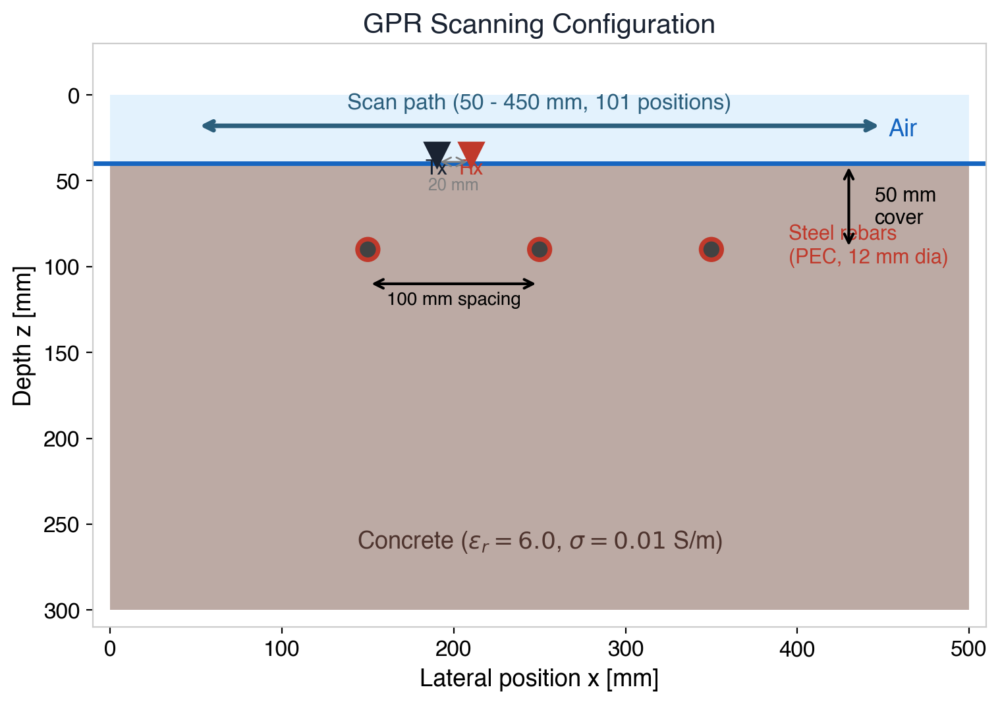<br>
<figcaption><em>Figure 1. Synthetic GPR measurement geometry. The 2-D forward model contains an air/concrete interface and steel rebar targets; scanning the transmitter/receiver pair along the surface produces a B-scan.</em></figcaption>
</figure>


<figure>
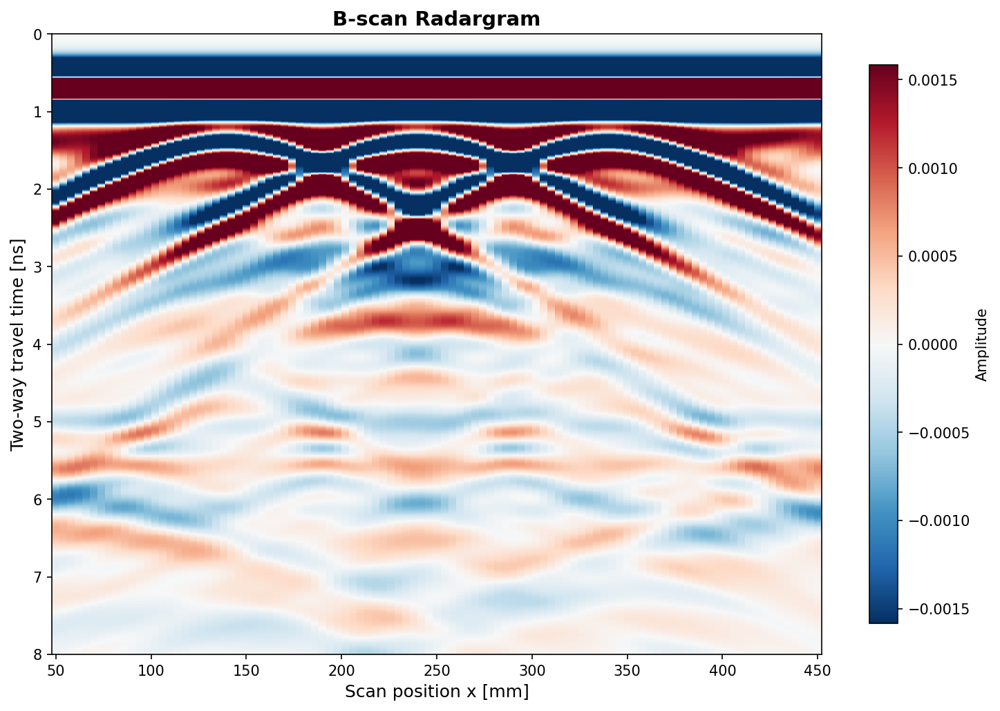<br>
<figcaption><em>Figure 2. Simulated B-scan. Each rebar produces a hyperbola in the position-versus-time radar image; this image is the starting point for detection and inversion.</em></figcaption>
</figure>


<figure>
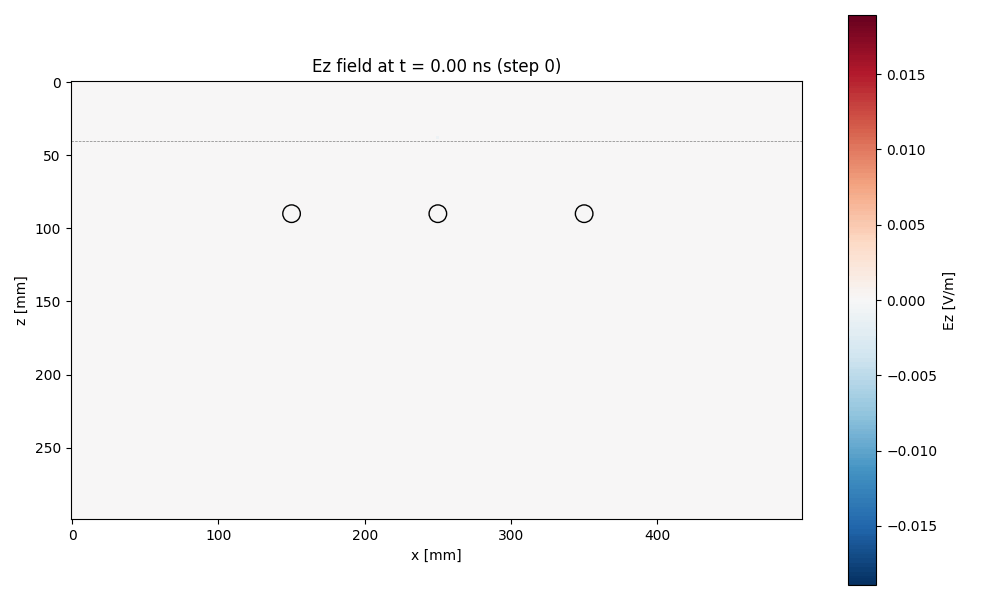<br>
<figcaption><em>Figure 3. Forward wave propagation animation. The radar pulse enters the slab, scatters from steel bars, and returns to the receiver; this is the physical process solved by FDTD.</em></figcaption>
</figure>


<figure>
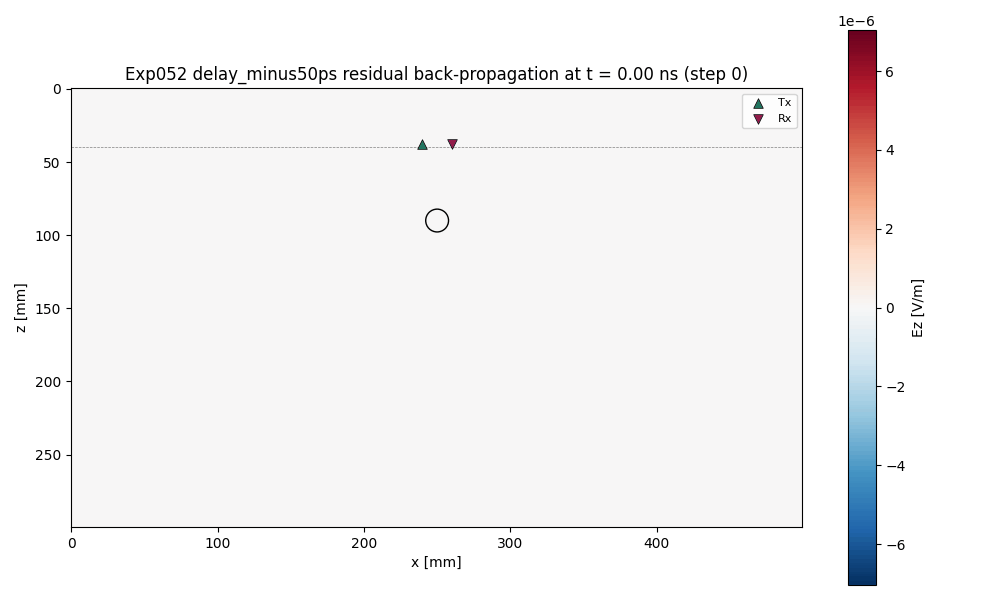<br>
<figcaption><em>Figure 4. Back-propagated residual diagnostic. The residual field is propagated through the model to reveal where waveform mismatch contributes to an update signal, illustrating the adjoint-style information pathway used in the framework.</em></figcaption>
</figure>


<figure>
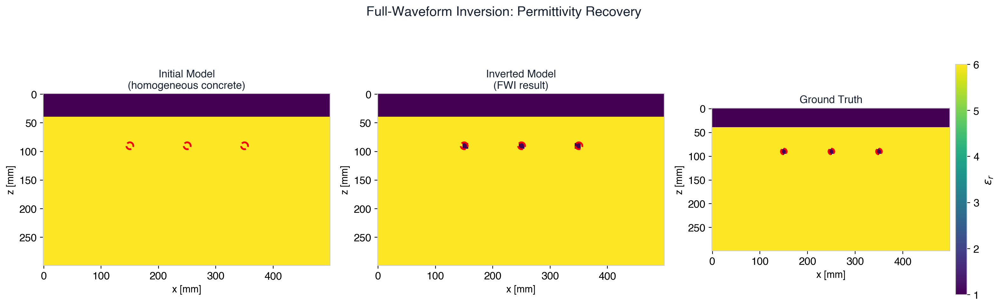<br>
<figcaption><em>Figure 5. Baseline inversion result. The early framework recovered the target geometry on clean synthetic data and established the forward/inverse simulation foundation.</em></figcaption>
</figure>

<figure>
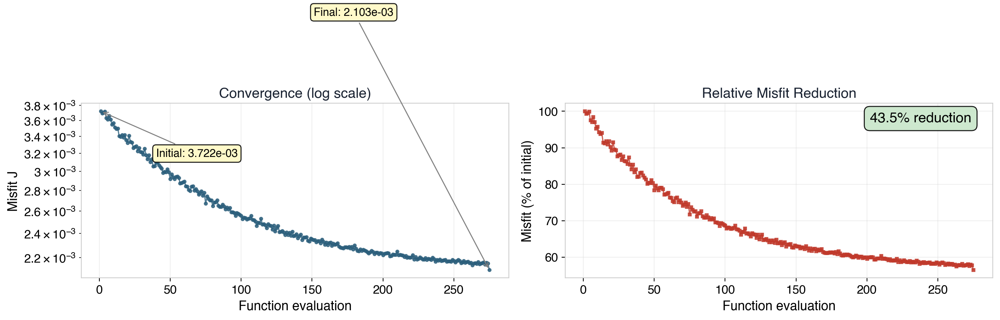<br>
<figcaption><em>Figure 6. Representative convergence curve. The objective decreases as the model is corrected, confirming that the baseline inverse loop is numerically well behaved.</em></figcaption>
</figure>


## 2. Baseline Single-Rebar Milestone

The first numbered experiments established the simple case: one bar in concrete, synthetic data, and recovery of horizontal position `x`, depth `z`, and radius `r`.

On clean synthetic data, the pipeline recovered the baseline target at approximately `x = 250 mm`, `z = 90 mm`, and `r = 6.0 mm`, with the recovered material mask matching the truth on the working grid. The effective recipe was a coarse search to reach the correct neighborhood, a local refinement, and a final grid polish to pin the radius.

This stage also revealed the central difficulty. Position and depth were comparatively stable, but radius could drift toward a too-thick solution when continuous optimization was used directly. The reason is not only optimizer behavior: small circles on a finite grid can share identical rasterized masks over nearby radii, and neighboring geometries can produce extremely similar B-scans. This made radius confidence, not only radius point estimation, the main research question.


## 3. Method Selection From Five Published Strategies

Rather than adopting a complex method prematurely, we used five published FWI ideas as a hypothesis menu and tested what actually moved the radius estimate in our setting.

| Strategy | Question tested | Outcome in this project |
|---|---|---|
| Wavefield reconstruction inversion (WRI) | Would low-frequency-first relaxation solve the radius trap? | We adopted the frequency-weighting intuition, but not the full heavy solver. |
| Progressively expanded bandwidth (PEBDD) | Does starting from a low band and widening the band recover size? | Useful for position seeds, not sufficient for radius selection. |
| Optimal transport then least-squares (OT-LS) | Is the radius problem cycle-skipping? | The diagnostic showed the radius trap was not primarily cycle-skipping. |
| Quadratic Wasserstein distance for GPR | Does W2 improve the radius objective? | It helps timing-shift examples but collapses radius sensitivity because amplitude detail matters. |
| Implicit/neural multi-parameter FWI | Is a neural material-map parameterization needed now? | Deferred until explicit nuisance parameters and staged physics tests become insufficient. |

The result was a narrower and more defensible design: use frequency information selectively, keep W2 as a diagnostic, avoid adding free material parameters when they fail to explain the bias, and prioritize source-pulse profiling because it directly fixes the observed radius failure.


<figure>
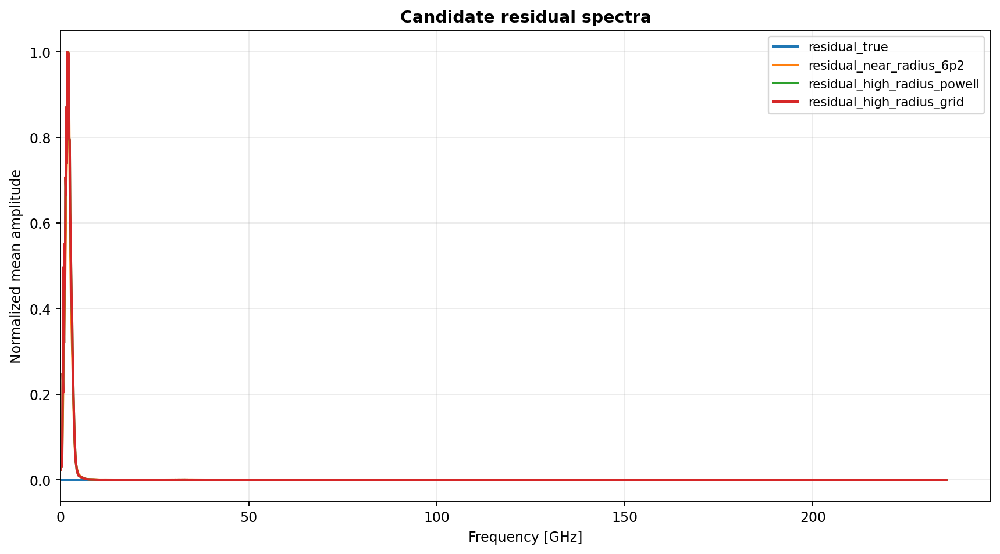<br>
<figcaption><em>Figure 8. Radius-sensitive spectral content. Low-frequency staged bandwidth is useful for position seeding, but the size-discriminating energy is concentrated in the higher band used during polish.</em></figcaption>
</figure>

<figure>
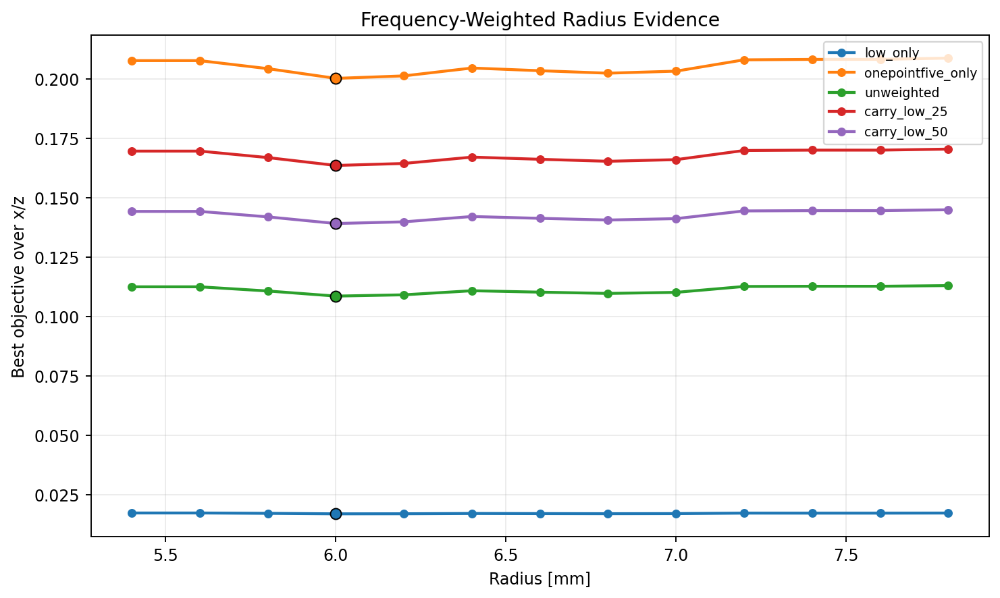<br>
<figcaption><em>Figure 9. Frequency weighting test. Equal averaging of weak and strong bands dilutes radius evidence; the production objective weights toward the size-sensitive band.</em></figcaption>
</figure>


<figure>
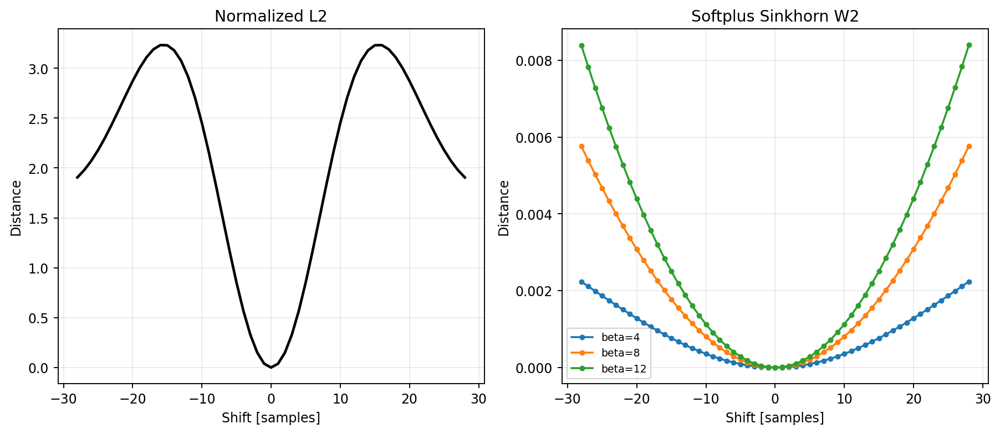<br>
<figcaption><em>Figure 10. Wasserstein distance gate test. The method behaves well on artificial timing shifts, confirming the paper claim, but this is not the dominant error mode for radius sizing.</em></figcaption>
</figure>

<figure>
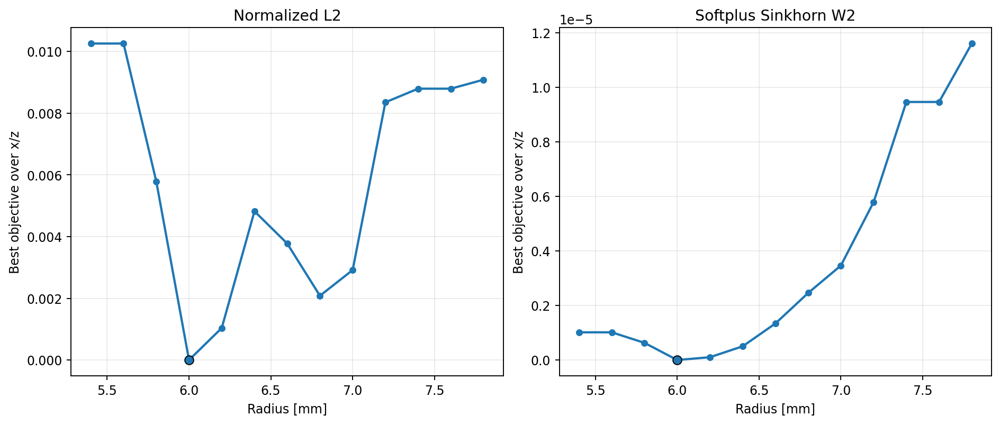<br>
<figcaption><em>Figure 11. Wasserstein radius landscape. On the actual radius task the W2 objective becomes nearly flat, so it is retained as a diagnostic rather than the production radius objective.</em></figcaption>
</figure>


## 4. Principal Finding: Source-Wavelet Mismatch Drives Radius Error

Real radar equipment does not emit the exact pulse assumed by a simulation. We therefore perturbed the observed pulse while keeping the inversion pulse fixed. Small changes in amplitude, time zero, or center frequency were enough to move the recovered radius to the wrong value.

The remedy was to treat pulse amplitude, time shift, and center-frequency scale as nuisance parameters solved at each candidate geometry. With all three enabled, the same mismatch cases returned to the correct radius. This is the most important methodological addition in the project because it prevents a wrong pulse from being absorbed as a wrong bar size.


<figure>
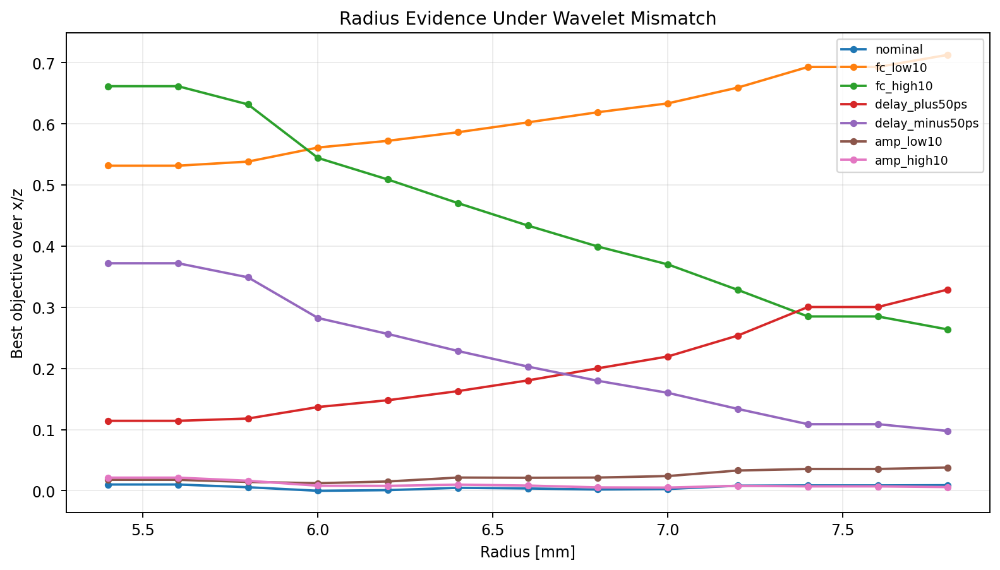<br>
<figcaption><em>Figure 12. Source-wavelet mismatch failure. Small amplitude, timing, or center-frequency errors can push the recovered radius to the wrong value when the pulse is treated as fixed.</em></figcaption>
</figure>

<figure>
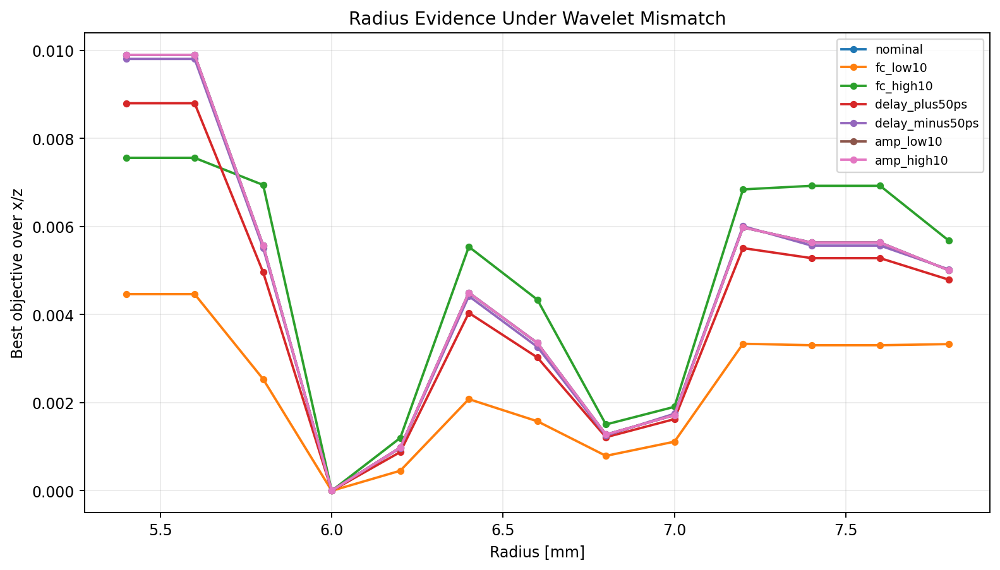<br>
<figcaption><em>Figure 13. Source-profiled correction. Fitting pulse amplitude, time shift, and center-frequency as nuisance parameters restores the correct radius across mismatch cases.</em></figcaption>
</figure>


## 5. Confidence-Aware Multi-Rebar Reporting

The next milestone moved from one bar to multiple bars. The system recovered common-radius and per-target radius cases, then progressed to local position-plus-radius updates for left, center, and right targets under 10 percent noise and source mismatch.

The important result was not just that the point estimates were often correct. The margin information showed that many correct estimates were weakly separated from nearby alternatives. We therefore made uncertainty reporting mandatory: every result carries a confidence label and an ambiguity interval. In a 24-case multi-rebar replication, all 24 point estimates were correct, but 22 were labeled weak and 2 moderate. This is the right behavior for a scientific pipeline: it avoids overstating precision when the waveform evidence is thin.


<figure>
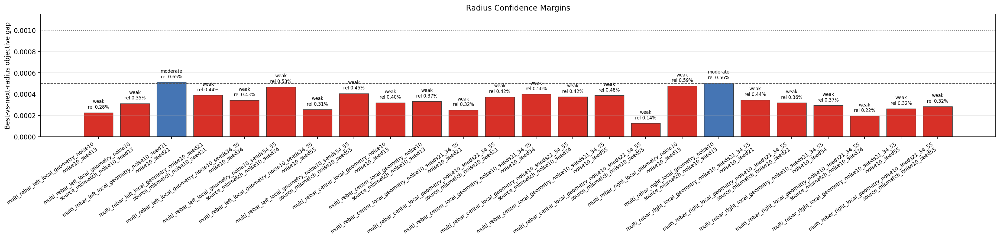<br>
<figcaption><em>Figure 14. Multi-rebar confidence reporting. Correct point estimates can still have weak margins; the pipeline therefore reports labels and ambiguity intervals instead of only a single radius.</em></figcaption>
</figure>


## 6. Detection-to-Inversion Pipeline

Early refinement experiments assumed an approximate target location. The next milestone added a detector that starts from the B-scan itself. It removes the background, maps echo energy, and scores candidate hyperbola arcs. A source-time correction is required; otherwise targets appear too deep.

The single-rebar detector benchmark covered 48 scenarios: depths from 70 to 130 mm, radii from 4 to 10 mm, noise levels up to 10 percent, and pulse-mismatch cases. It detected the target in all 48 scenarios. Multi-rebar detection then provided seed windows for the staged refinement pipeline.

The refinement pipeline uses a cost-controlled sequence: a coarse screen rejects poor windows, a narrow source-profiled polish refines survivors, and optional high-band or material-uncertainty checks are added when the question is radius confidence rather than only a point estimate.


<figure>
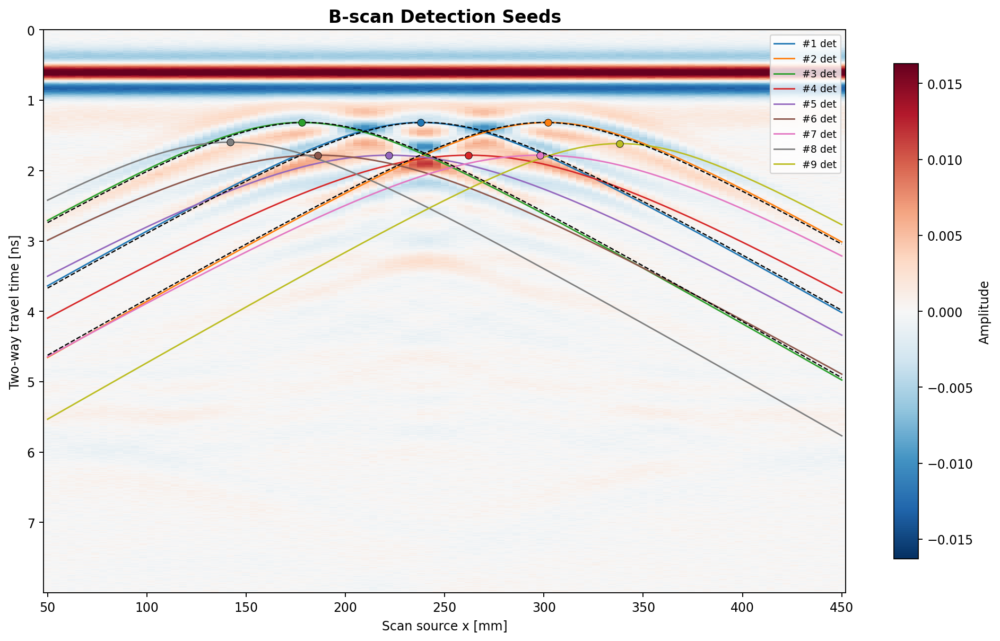<br>
<figcaption><em>Figure 15. Detection from the B-scan. The detector identifies seed windows for closely spaced bars under noise and pulse mismatch, removing the assumption that target locations are known.</em></figcaption>
</figure>

<figure>
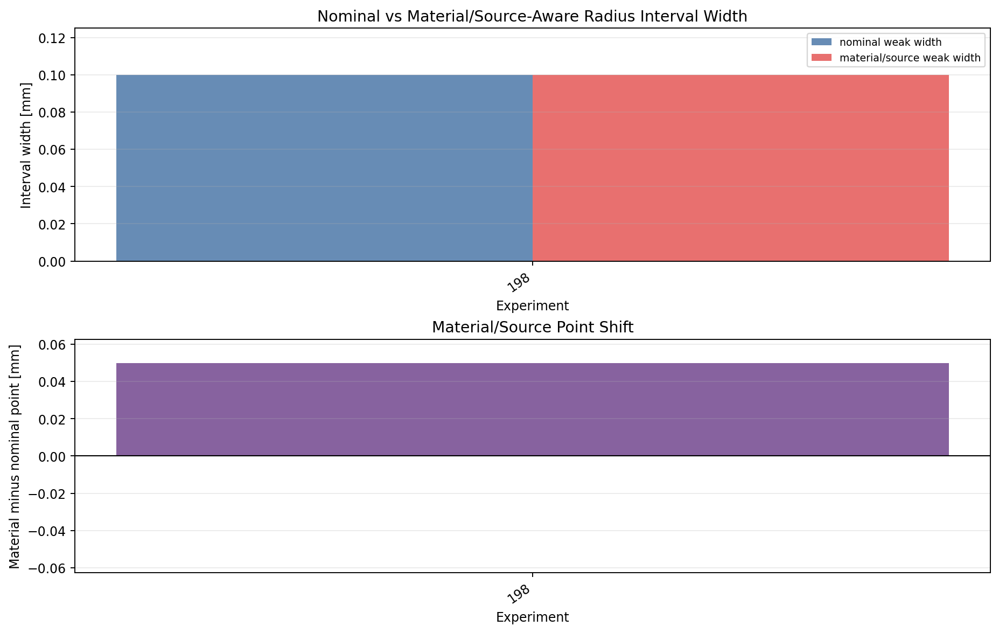<br>
<figcaption><em>Figure 16. High-band and material-uncertainty summary. Higher-frequency acquisition improves size confidence, while material uncertainty is reported explicitly when it widens intervals.</em></figcaption>
</figure>


## 7. Current Frontier: Variable-Radius, Closely Spaced Bars

The active research branch studies three closely spaced bars with different sizes, nominally 5, 6, and 8 mm radius. This is harder than the earlier same-radius setting because a small position error on one bar can be absorbed by an inflated radius on another.

A controlled oracle test clarified the ordering: if target positions are fixed to truth, the joint radius objective ranks the true `(5, 6, 8) mm` triple first. If positions are fixed to slightly wrong detector seeds, the same radius search can prefer inflated sizes. The conclusion is architectural: correct positions before reading size.

The resulting staged policy is:

1. Detect bars in the B-scan.
2. Assign one clean seed per physical bar.
3. Run a location-only pass with radii held fixed.
4. Apply focused position-plus-size polish to hard bars.
5. Estimate the radius set at the corrected positions and report ambiguity intervals.


<figure>
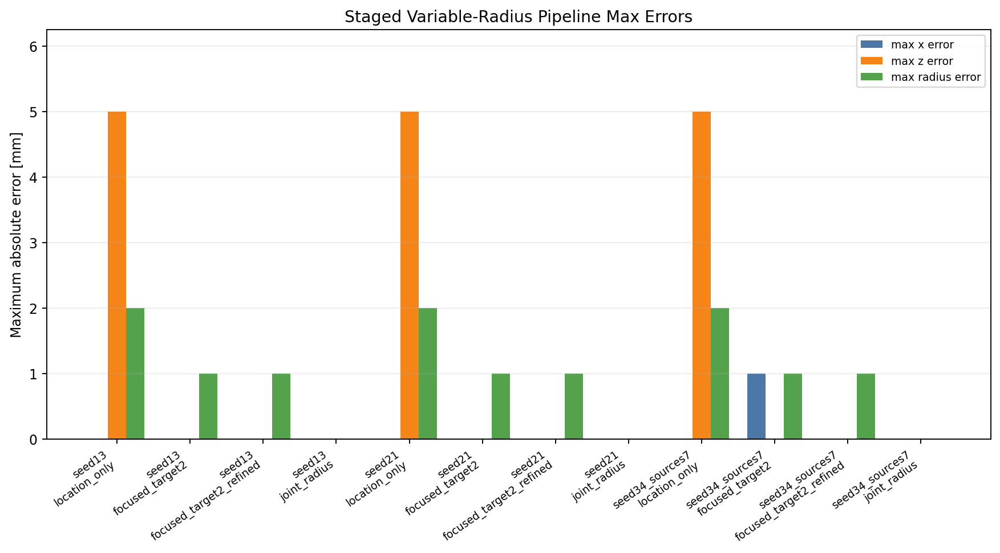<br>
<figcaption><em>Figure 17. Variable-radius staged pipeline. Correcting position before estimating size prevents the multi-bar search from inflating neighboring radii.</em></figcaption>
</figure>


## 8. Acquisition Design as an Inversion Parameter

The remaining difficulty was lateral ambiguity for tight bar spacing. We treated measurement design itself as part of the inversion problem.

The evidence so far is clear:

- Increasing source positions helps, but the benefit depends on spacing.
- At 60 mm spacing, more positions can close the lateral ambiguity.
- At 50 mm spacing, source count alone is less reliable.
- Widening the Tx/Rx offset from 20 mm to 40 mm is the strongest tested lever for the close-50 mm case.
- The newest four-source, 40 mm Tx/Rx aggregate across seeds 13, 21, and 34 reports six strong rows and zero lateral ambiguity width.

A newer 30 mm Tx/Rx comparison branch has also completed for seeds 13, 21, and 34. Those runs recover the correct hard target with strong labels, but their radius margins are lower than the 40 mm branch: approximately 0.0017-0.0023 absolute margin for 30 mm versus approximately 0.0048-0.0081 for 40 mm in the replicated four-source branch. This supports the current interpretation that 40 mm is the more decisive tested geometry for the close-50 mm target.


<figure>
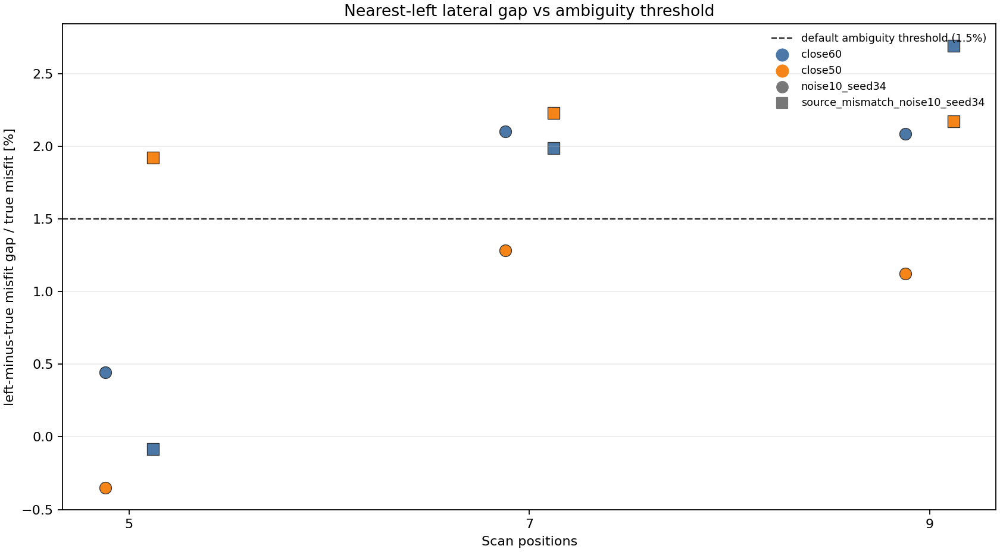<br>
<figcaption><em>Figure 18. Lateral ambiguity threshold. Tight spacing produces a real lateral-position ambiguity unless the acquisition geometry adds enough separating information.</em></figcaption>
</figure>

<figure>
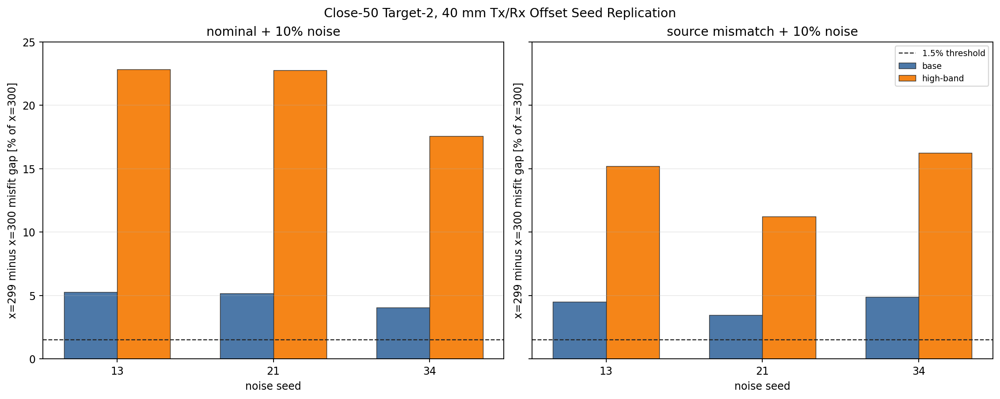<br>
<figcaption><em>Figure 19. Tx/Rx offset replication. Increasing the transmitter/receiver offset to 40 mm improves separation in the close-50 mm spacing case across noise seeds.</em></figcaption>
</figure>


<figure>
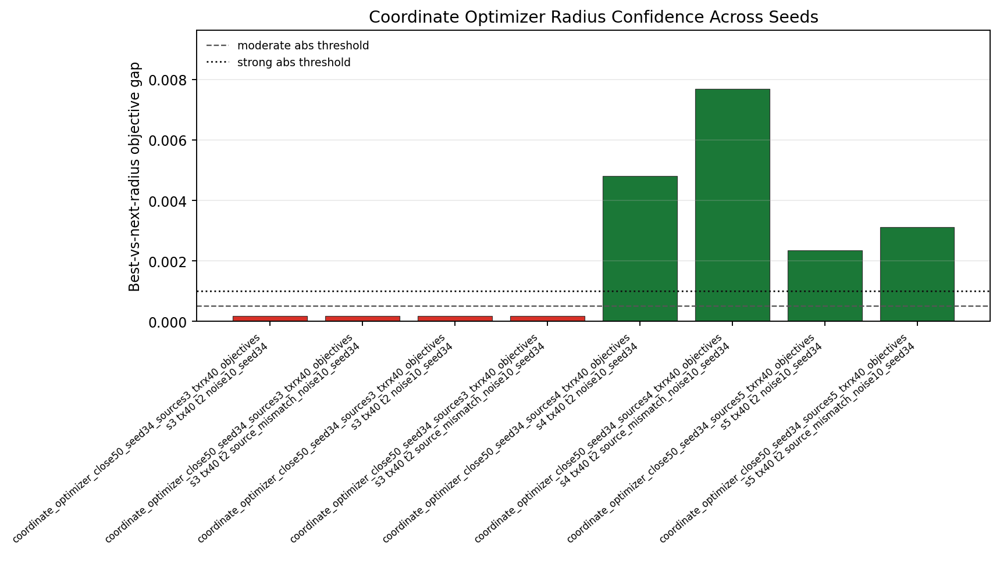<br>
<figcaption><em>Figure 20. Three-, four-, and five-source comparison at 40 mm Tx/Rx offset. Four and five source positions both resolve the hard target in the seed-34 close-spacing branch; three sources remain weaker.</em></figcaption>
</figure>

<figure>
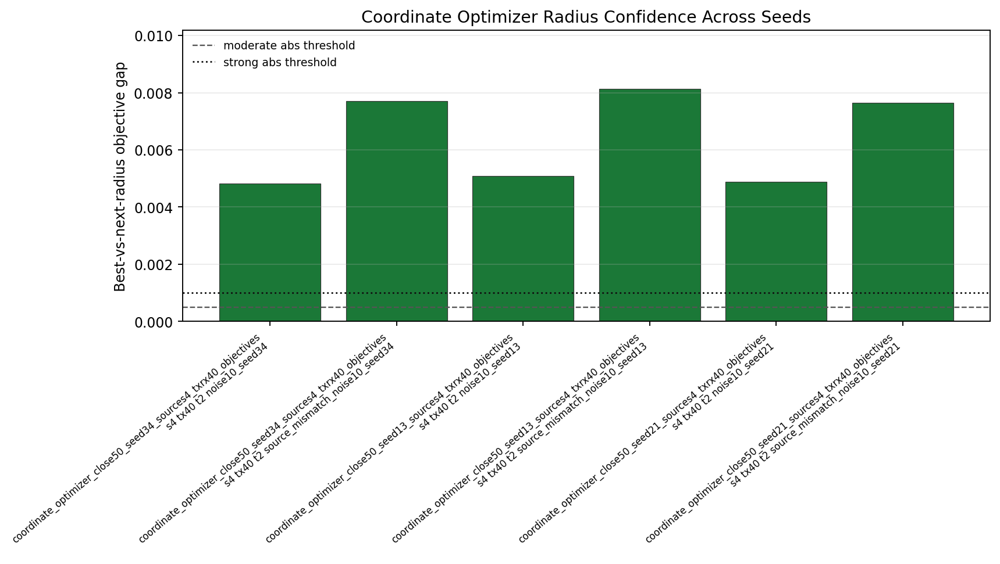<br>
<figcaption><em>Figure 21. Four-source, 40 mm Tx/Rx replication. Across three noise seeds and two source conditions, all six rows are strong and the recovered geometry matches truth.</em></figcaption>
</figure>

<figure>
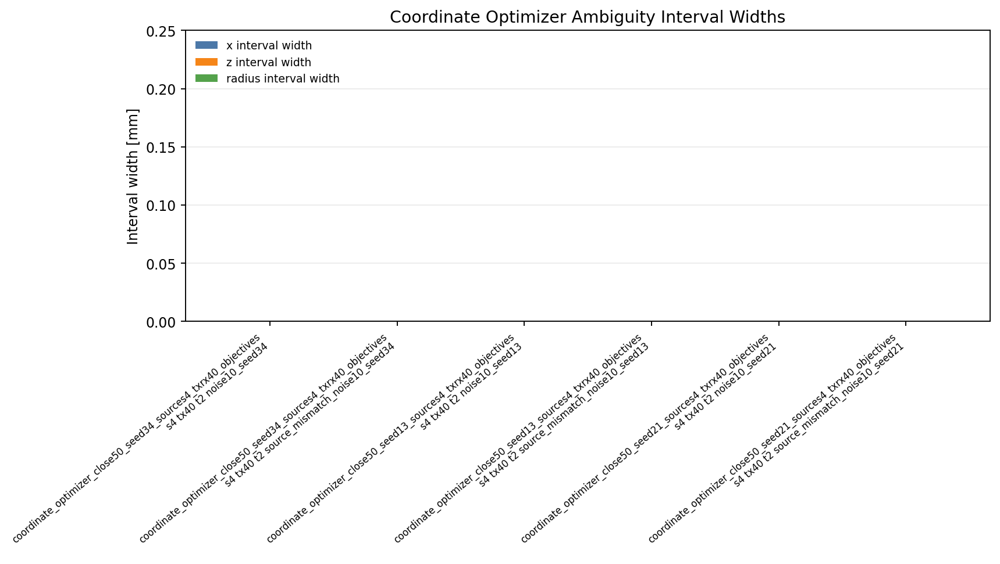<br>
<figcaption><em>Figure 22. Four-source ambiguity widths. The replicated 40 mm Tx/Rx branch reports zero lateral ambiguity width for the target under the tested noise and source-mismatch cases.</em></figcaption>
</figure>


## 9. Computational Platform and Runtime Cost

Production sweeps and computationally intensive FDTD solves were run GPU-first on an NVIDIA DGX Spark workstation built around the GB10 Grace Blackwell superchip. Small CPU smoke diagnostics also exist in the archive, so the GPU statement is intended as production-compute practice rather than a claim that every auxiliary test was GPU-only.

| Component | Specification used in the report |
|---|---|
| Platform | NVIDIA DGX Spark, GB10 Grace Blackwell superchip |
| GPU | Blackwell-generation GPU, about 6,144 CUDA cores, 5th-generation Tensor Cores |
| CPU | 20-core Arm CPU, observed locally as 10 Cortex-X925 cores plus 10 Cortex-A725 cores |
| Memory | 128 GB unified LPDDR5x memory, observed locally as about 119 GiB usable RAM |
| Memory bandwidth | NVIDIA-published figure: about 273 GB/s |
| Software environment | CUDA 13.0/CuPy 14.0.1 in the experiment notes; local driver observed as 580.95.05, compute capability 12.1 |

The practical FDTD cost in our inversion workflow is about **1 second per transmit position**, or about **5 seconds for a 5-position local B-scan per frequency band**. This is measured from experiment logs, not only from a kernel micro-benchmark. Experiment 057 evaluated 12 five-position B-scans in 58.8 s, and experiment 058 evaluated 156 candidate/source-scale B-scan solves in 771.0 s, both giving about 4.9-5.0 s per 5-position B-scan.

The longer experiment wall times come from deliberate sweeps over geometry, source-pulse nuisance parameters, frequency bands, and noise seeds. Representative measured runtimes are:

| Operation | Setting | Scale | Wall time |
|---|---|---:|---:|
| Full local B-scan solve | 5 positions, one band, measured from exp 057/058 | 1 B-scan | ~5 s |
| Coarse screen | run 118, 2 mm grid, 5 sources | 77 candidates | 282 s |
| Fine polish | run 118, 1 mm grid, 5 sources | 15 candidates | 247 s |
| Detection -> coarse -> fine package | run 118, end to end | staged | 546 s |
| Direct 1 mm source-profiled grid | run 111 | 66 candidates | 1061 s |
| Four-source close-50, 40 mm Tx/Rx | runs 276, 278, 279 | 3 seeds, 2 cases each | about 21-22 min per seed |
| Four-source close-50, 30 mm Tx/Rx | runs 281-283 | 3 seeds, 2 cases each | about 21-22 min per seed |

The bare GPU field-update benchmark is still useful as a lower-level reference: at the 50K-cell grid it runs at about 0.10 s per 500 steps and is 3.2x faster than CPU in the benchmark. The measured B-scan number above is the relevant end-to-end workflow cost because it includes CPML, source injection, receiver gathering, objective filtering, and Python orchestration.


<figure>
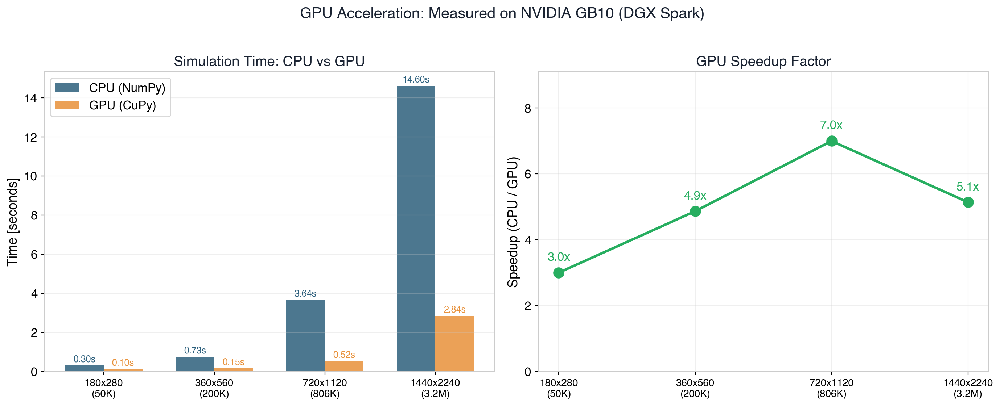<br>
<figcaption><em>Figure 7. GPU acceleration benchmark. The bare field-update kernels are faster on the GB10 GPU than CPU at the project grid size, with higher speedups on larger grids.</em></figcaption>
</figure>


## 10. Experiment Archive Snapshot

As of this report snapshot, the archive contains 283 numbered experiment folders under `outputs/experiments/`. The written experiment logs under `docs/experiments/` contain 49 Markdown trackers, and the output folders contain more than 560 figure or animation files.

| Milestone | Main question | Experiment range | Main outcome |
|---|---|---:|---|
| Framework and baseline | Can the code simulate GPR B-scans and invert simple synthetic geometry? | pre-numbered, 001-023 | Forward solver, GPU benchmark, and clean single-bar recovery established. |
| Five-strategy study | Which published ideas actually help radius? | 024-062 | Source profiling and selective frequency weighting survive; W2 and free material parameters are not production radius objectives. |
| Multi-rebar confidence | Can several bars be refined without overstating precision? | 063-106 | Correct estimates are paired with confidence labels and ambiguity intervals. |
| Detection-to-inversion | Can the pipeline start from a B-scan without known target locations? | 107-201 | Detector succeeds on the 48-case benchmark; staged refinement controls runtime. |
| Variable-radius frontier | Can differently sized, close bars be resolved? | 202-283 | Position-before-size staging works; acquisition design, especially Tx/Rx offset, is the current lever. |


## 11. Current Capabilities and Limitations

**Established on 2-D synthetic data:**

- Stable FDTD forward modeling with B-scan and wavefield outputs.
- Baseline adjoint-capable FWI framework and production source-profiled full-waveform candidate evaluation.
- Single-bar position, depth, and radius recovery under controlled noise.
- Source-wavelet mismatch correction through amplitude, timing, and center-frequency profiling.
- Multi-rebar confidence reporting with margins and ambiguity intervals.
- B-scan-driven detection and staged refinement.
- Variable-radius close-spacing recovery when position correction is staged before size estimation.
- Acquisition-design evidence showing that 40 mm Tx/Rx offset materially improves the close-50 mm case.

**Known limitations:**

- Results are synthetic and two-dimensional; laboratory and field validation remain open.
- Shallow, thin bars can still be better reported as intervals than as single exact radii under noise and pulse mismatch.
- Grid rasterization limits sub-millimeter radius claims unless finer grids or subcell geometry are used carefully.
- Very close lateral spacing can remain ambiguous unless the acquisition geometry adds separating information.
- The current orchestrated workflow is still being consolidated from several scripts into one reproducible runner.


## 12. Forward Plan

1. **Package the staged workflow.** Consolidate detect -> assign -> locate -> focus -> size into a single runner that emits geometry estimates, confidence labels, ambiguity intervals, runtimes, and validated figures.

2. **Formalize acquisition design.** Treat source count, scan spacing, center frequency, and Tx/Rx offset as experimental variables rather than after-the-fact settings. The close-50 mm branch indicates that 40 mm Tx/Rx offset is the strongest tested lever so far.

3. **Calibrate uncertainty thresholds.** Convert weak/moderate/strong labels from practical reporting categories into thresholds tied to noise models and repeated trials.

4. **Move toward laboratory data.** Add realistic antenna response, nonideal source signatures, concrete heterogeneity, and measured B-scans. The source-profiled framework is designed specifically to make that transition less brittle.

5. **Reserve heavier methods for the right failure mode.** WRI and neural implicit parameterizations remain useful candidates if explicit nuisance modeling and staged coordinate search become insufficient on real data.


## 13. Figure Traceability

Every figure or animation embedded in this notebook was copied from an archived project output. The table below gives the canonical source path for each item.

| Figure | Canonical source path |
|---|---|
| Figure 1 | `outputs/presentation_figures_v2/scanning_geometry.png` |
| Figure 2 | `outputs/figures/bscan.png` |
| Figure 3 | `outputs/animations/wave_propagation.gif` |
| Figure 4 | `outputs/experiments/052_wavelet_mismatch_radius_exact/figures/delay_minus50ps_nominal_r7p8_muted_residual_backprop.gif` |
| Figure 5 | `outputs/presentation_figures_v2/inversion_comparison.png` |
| Figure 6 | `outputs/presentation_figures_v2/convergence.png` |
| Figure 7 | `outputs/presentation_figures_v2/gpu_benchmark.png` |
| Figure 8 | `outputs/experiments/043_pebd_spectrum_design_exact/figures/residual_spectra.png` |
| Figure 9 | `outputs/experiments/047_frequency_weight_radius_margin_noise10_seed13/figures/frequency_weight_radius_profiles.png` |
| Figure 10 | `outputs/experiments/048_trace_wasserstein_convexity_smoke/figures/trace_w2_convexity.png` |
| Figure 11 | `outputs/experiments/051_w2_landscape_exact_beta8_ds8/figures/w2_radius_profiles.png` |
| Figure 12 | `outputs/experiments/052_wavelet_mismatch_radius_exact/figures/wavelet_mismatch_radius_profiles.png` |
| Figure 13 | `outputs/experiments/055_wavelet_mismatch_radius_amp_time_freqfit/figures/wavelet_mismatch_radius_profiles.png` |
| Figure 14 | `outputs/experiments/080_multi_rebar_stage7_ambiguity_interval_report/figures/candidate_confidence_margins.png` |
| Figure 15 | `outputs/experiments/114_detection_multi_rebar_close_spacing_source_mismatch_noise10/figures/detection_overlay.png` |
| Figure 16 | `outputs/experiments/199_packaged_highband_material_uncertainty_aggregate_178_198/figures/two_stage_material_uncertainty_summary.png` |
| Figure 17 | `outputs/experiments/257_variable_radius_staged_pipeline_seed13_21_34_sources7_refinement_summary/figures/staged_variable_radius_pipeline_errors.png` |
| Figure 18 | `outputs/experiments/263_lateral_gap_threshold_close50_vs_close60_summary/figures/lateral_neighbor_gap_thresholds.png` |
| Figure 19 | `outputs/experiments/271_close50_txrx40_seed_replication_summary/figures/txrx40_seed_gap_replication.png` |
| Figure 20 | `outputs/experiments/277_coordinate_confidence_aggregate_close50_txrx40_sources3_4_5_seed34/figures/coordinate_confidence_aggregate.png` |
| Figure 21 | `outputs/experiments/280_coordinate_confidence_close50_sources4_txrx40_seed_replicates/figures/coordinate_confidence_aggregate.png` |
| Figure 22 | `outputs/experiments/280_coordinate_confidence_close50_sources4_txrx40_seed_replicates/figures/coordinate_ambiguity_widths.png` |


## 14. Source Notes

Project-internal traceability is maintained through `docs/experiments/`, `docs/papers/`, and `outputs/experiments/`. The five strategy-paper notes are:

- `docs/papers/01_wavefield_reconstruction_2022.md`
- `docs/papers/02_progressive_bandwidth_fwi_2021.md`
- `docs/papers/03_optimal_transport_fwi_2025.md`
- `docs/papers/04_quadratic_wasserstein_gpr_fwi_2024.md`
- `docs/papers/05_implicit_multiparameter_gpr_fwi_2025.md`

Hardware specifications are based on NVIDIA's published DGX Spark / GB10 specifications and the local run environment. Official hardware references used for this report are:

- NVIDIA DGX Spark product page: https://www.nvidia.com/en-us/products/workstations/dgx-spark/
- NVIDIA DGX Spark User Guide PDF: https://docs.nvidia.com/dgx/dgx-spark/dgx-spark.pdf

---

*This document is a self-contained research progress notebook. Media are embedded directly in the notebook so it can be opened without resolving relative image paths.*
